# Introduction

The report presents a deep learning-based approach to classifying tweets into relevant or irrelevant real-world **natural disasters**. This was inspired by the **"Natural Language Processing with Disaster Tweets" competition on Kaggle**. The most important goal of this challenge is to come up with an efficient Natural Language Processing model that could classify tweets for relevance between disaster-related and non-disaster tweets. It outlines various preprocessing techniques, deep learning methods, and tuning of hyperparameters that will yield the best results.

# About the Dataset

Dataset source: https://www.kaggle.com/competitions/nlp-getting-started/data

The goal of this project is to label tweets whether they are about a natural disaster or not.

This has 2 datasets - train.csv and test.csv, and the competetion requires to predict labels for the tweets in the test.csv file basis the training data.

Following are the columns of the dataset:
1. **id** - a unique identifier for each tweet
2. **text** - the text of the tweet
3. **location** - the location the tweet was sent from (high percentage of null values)
4. **keyword** - a particular keyword from the tweet (high percentage of null values)
5. **target** - in train.csv only, this denotes whether a tweet is about a real disaster (1) or not (0)



# GPU Details

Tesla T4 by Google Colab
- Memory: 16GB
- cores: 40
- Architecture: Turing

# Importing the Required Libraries

In [1]:
!pip install keras-tuner

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 2.9 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, GlobalAveragePooling1D, Dense, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import callbacks
from sklearn.metrics import accuracy_score,f1_score,confusion_matrix
import matplotlib.pyplot as plt
from collections import Counter
from prettytable import PrettyTable
from google.colab import files
from tensorflow.keras.callbacks import TensorBoard
import os
import datetime
import keras
import keras_tuner as kt
import re
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import seaborn as sns
from wordcloud import WordCloud

# Download necessary NLTK packages

In [3]:
nltk.download('stopwords')
nltk.download('wordnet')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


True

# Alarming Words

In [4]:
alarming_words = [
                    'accident', 'alert', 'attack', 'bomb', 'casualties', 'catastrophe', 'collapse', 'crisis',
                    'danger', 'dead','death', 'deaths', 'devastation', 'disaster', 'destroyed', 'earthquake',
                    'epidemic','evacuate', 'explosion', 'fatal', 'fatalities', 'flood', 'hazard', 'hurricane',
                   'injured', 'landslide', 'lockdown', 'massive', 'pandemic', 'quarantine',
                   'rescue', 'riot', 'shooting', 'storm', 'trapped', 'tornado',
                   'tsunami', 'urgent', 'virus', 'warning', 'war', 'wildfire', 'widespread'
]

# Preprocessing the  text

In [5]:
def preprocess_text(text):
    """

    Preprocesses the input text by performing the following steps:
    1. Removes URLs.
    2. Removes non-alphabetic characters.
    3. Converts text to lowercase.
    4. Tokenizes text into words.
    5. Removes stopwords.
    6. Lemmatizes words to their base form.

    Parameters:
    text (str): The input text to be preprocessed.

    Returns:
    str: The cleaned and preprocessed text as a single string.

    Dependencies:
    - re (Regular Expressions)
    - nltk.corpus.stopwords (Stopword removal)
    - nltk.stem.WordNetLemmatizer (Lemmatization)

    """
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'[^a-zA-Z]', ' ', text)
    text = text.lower()
    text = text.split() # Tokenize
    stop_words = set(stopwords.words('english'))
    # Added additional stopwords
    custom_stopwords = {"via", "amp", "u","new","one","news","car"}
    stop_words.update(custom_stopwords)
    lemmatizer = WordNetLemmatizer()
    text = [lemmatizer.lemmatize(word) for
            word in text if word not in stop_words]
    return ' '.join(text)

# Function to count alarming words

In [6]:
def count_alarming_words(text):
    """
    Counts the number of predefined alarming words present in the given text.

    Parameters:
    text (str): The input text in which alarming words are to be counted.

    Returns:
    int: The count of alarming words found in the text.
    """
    words = text.split()
    return sum(1 for word in words if word in alarming_words)

# Pipeline Function to Preprocess Data

In [7]:
def process_data(train_df, test_df):
    """
    Processes text data for machine learning by applying preprocessing, feature extraction, and tokenization.

    Steps performed:
    1. Applies text preprocessing using `preprocess_text()` on the 'text' column of both training and testing datasets.
    2. Counts the number of alarming words in the cleaned text using `count_alarming_words()`.
    3. Tokenizes the cleaned text and converts it into sequences using a `Tokenizer`.
    4. Pads sequences to ensure uniform input size for models.
    5. Extracts the target variable for training.

    Parameters:
    train_df (pd.DataFrame): The training dataset containing at least 'text' and 'target' columns.
    test_df (pd.DataFrame): The testing dataset containing at least a 'text' column.

    Returns:
    tuple:
        - X_train (numpy.ndarray): Tokenized and padded sequences for training data.
        - X_test (numpy.ndarray): Tokenized and padded sequences for test data.
        - y_train (numpy.ndarray): Target labels for the training set.
        - tokenizer (Tokenizer): The fitted tokenizer object.
        - max_len (int): The maximum sequence length used for padding.
        - train_df (pd.DataFrame): Modified training DataFrame with cleaned text and alarming word counts.
        - test_df (pd.DataFrame): Modified testing DataFrame with cleaned text and alarming word counts.

    """
    # Apply preprocessing
    train_df['cleaned_text'] = train_df['text'].apply(preprocess_text)
    test_df['cleaned_text'] = test_df['text'].apply(preprocess_text)

    # Count alarming words
    train_df['alarming_word_count'] = train_df['cleaned_text'].apply(count_alarming_words)
    test_df['alarming_word_count'] = test_df['cleaned_text'].apply(count_alarming_words)

    # Tokenization and padding
    tokenizer = Tokenizer(num_words=20000)
    tokenizer.fit_on_texts(train_df['cleaned_text'])

    max_len = 100  # max sequence length
    X_train = pad_sequences(tokenizer.texts_to_sequences(train_df['cleaned_text']), maxlen=max_len)
    X_test = pad_sequences(tokenizer.texts_to_sequences(test_df['cleaned_text']), maxlen=max_len)

    # Prepare the target variable (labels) for training
    y_train = train_df['target'].values

    return X_train, X_test, y_train, tokenizer, max_len, train_df, test_df

# Loading datasets

In [8]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')

In [9]:
train_df = train_df.drop(columns=['keyword','location','id'])
train_df.head(10)

,text,target
0,Our Deeds are the Reason of this #earthquake M...,1
1,Forest fire near La Ronge Sask. Canada,1
2,All residents asked to 'shelter in place' are ...,1
3,"13,000 people receive #wildfires evacuation or...",1
4,Just got sent this photo from Ruby #Alaska as ...,1
5,#RockyFire Update => California Hwy. 20 closed...,1
6,#flood #disaster Heavy rain causes flash flood...,1
7,I'm on top of the hill and I can see a fire in...,1
8,There's an emergency evacuation happening now ...,1
9,I'm afraid that the tornado is coming to our a...,1


In [10]:
print(train_df.shape)

(7613, 2)


In [11]:
test_df = test_df.drop(columns=['keyword','location'])
test_df.head(10)

,id,text
0,0,Just happened a terrible car crash
1,2,"Heard about #earthquake is different cities, s..."
2,3,"there is a forest fire at spot pond, geese are..."
3,9,Apocalypse lighting. #Spokane #wildfires
4,11,Typhoon Soudelor kills 28 in China and Taiwan
5,12,We're shaking...It's an earthquake
6,21,They'd probably still show more life than Arse...
7,22,Hey! How are you?
8,27,What a nice hat?
9,29,Fuck off!


# Preprocess Data using Pipeline Function

In [12]:
X_train, X_test, y_train, tokenizer, max_len, train_df, test_df = process_data(train_df, test_df)

In [13]:
train_df.head(10)

,text,target,cleaned_text,alarming_word_count
0,Our Deeds are the Reason of this #earthquake M...,1,deed reason earthquake may allah forgive u,1
1,Forest fire near La Ronge Sask. Canada,1,forest fire near la ronge sask canada,0
2,All residents asked to 'shelter in place' are ...,1,resident asked shelter place notified officer ...,0
3,"13,000 people receive #wildfires evacuation or...",1,people receive wildfire evacuation order calif...,1
4,Just got sent this photo from Ruby #Alaska as ...,1,got sent photo ruby alaska smoke wildfire pour...,1
5,#RockyFire Update => California Hwy. 20 closed...,1,rockyfire update california hwy closed directi...,1
6,#flood #disaster Heavy rain causes flash flood...,1,flood disaster heavy rain cause flash flooding...,2
7,I'm on top of the hill and I can see a fire in...,1,top hill see fire wood,0
8,There's an emergency evacuation happening now ...,1,emergency evacuation happening building across...,0
9,I'm afraid that the tornado is coming to our a...,1,afraid tornado coming area,1


In [14]:
test_df.head(10)

,id,text,cleaned_text,alarming_word_count
0,0,Just happened a terrible car crash,happened terrible crash,0
1,2,"Heard about #earthquake is different cities, s...",heard earthquake different city stay safe ever...,1
2,3,"there is a forest fire at spot pond, geese are...",forest fire spot pond goose fleeing across str...,0
3,9,Apocalypse lighting. #Spokane #wildfires,apocalypse lighting spokane wildfire,1
4,11,Typhoon Soudelor kills 28 in China and Taiwan,typhoon soudelor kill china taiwan,0
5,12,We're shaking...It's an earthquake,shaking earthquake,1
6,21,They'd probably still show more life than Arse...,probably still show life arsenal yesterday eh eh,0
7,22,Hey! How are you?,hey,0
8,27,What a nice hat?,nice hat,0
9,29,Fuck off!,fuck,0


In [15]:
# Checking column names
print(train_df.columns)
print(test_df.columns)

Index(['text', 'target', 'cleaned_text', 'alarming_word_count'], dtype='object')
Index(['id', 'text', 'cleaned_text', 'alarming_word_count'], dtype='object')


# Alarming Words Frequency

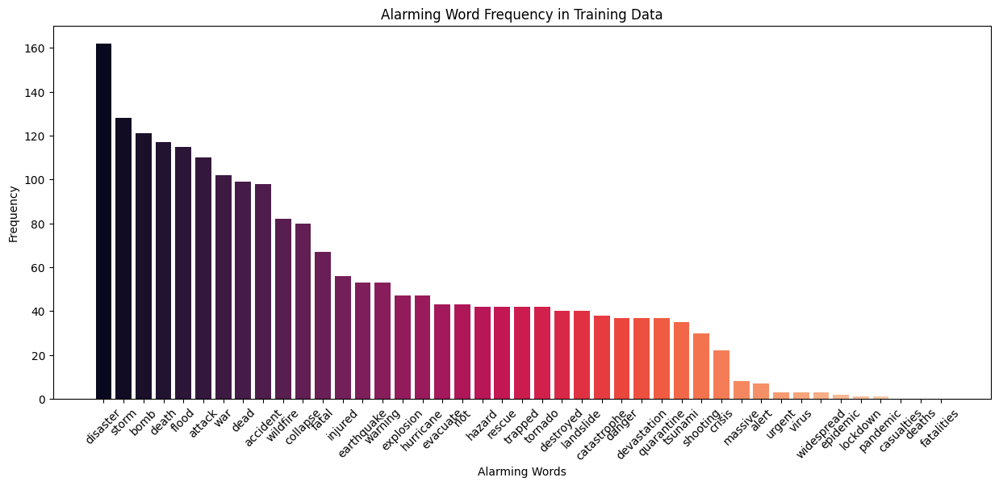

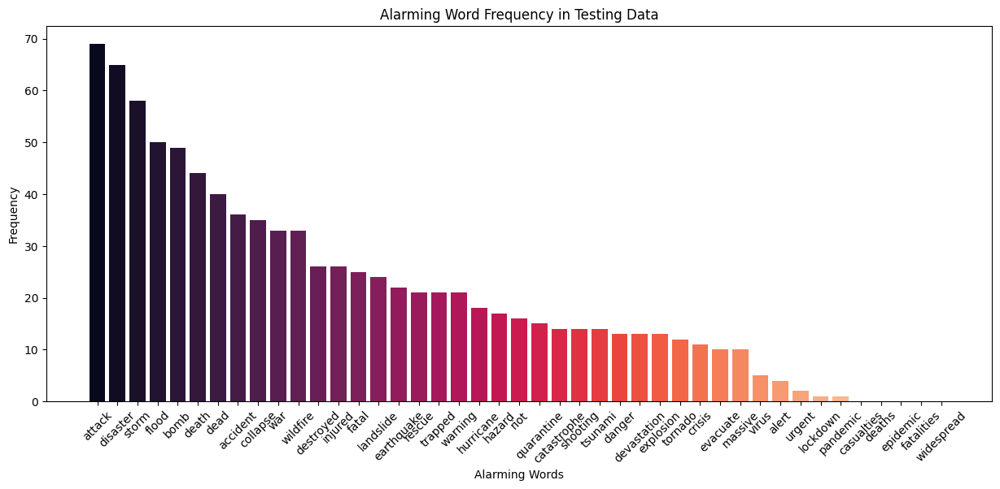

In [16]:
def plot_alarming_word_distribution(df, title):
    """
    Plots the distribution of alarming words found in the cleaned text column of a given DataFrame.

    Steps performed:
    1. Initializes a dictionary to store counts of each predefined alarming word.
    2. Iterates through the 'cleaned_text' column of the DataFrame and counts occurrences of alarming words.
    3. Sorts the words based on their frequency.
    4. Plots a bar chart using Matplotlib and Seaborn to visualize the distribution.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing a 'cleaned_text' column.
    title (str): The title of the plot.

    Returns:
    None: Displays a bar chart showing the frequency of alarming words.
    """
    alarming_word_counts = {word: 0 for word in alarming_words}

    for text in df['cleaned_text']:
        for word in text.split():
            if word in alarming_word_counts:
                alarming_word_counts[word] += 1

    # Sorting the words by frequency
    sorted_words = sorted(alarming_word_counts.items(), key=lambda x: x[1], reverse=True)
    words, counts = zip(*sorted_words)

    # Generate unique colors for each bar
    colors = sns.color_palette("rocket", len(words))
    plt.figure(figsize=(15, 6))
    plt.bar(words, counts, color=colors)
    plt.xticks(rotation=45)
    plt.xlabel("Alarming Words")
    plt.ylabel("Frequency")
    plt.title(title)
    plt.show()

# Training Data
plot_alarming_word_distribution(train_df, "Alarming Word Frequency in Training Data")

# Testing Data
plot_alarming_word_distribution(test_df, "Alarming Word Frequency in Testing Data")




1.   This Training data chart represents the frequency of alarming words found in the training dataset. It highlights the words most commonly associated with alarming or emergency-related content.
Words like "disaster", "storm", "bomb", and "death" are the most frequently occurring, with "disaster" being the most frequent, appearing over 160 times in the dataset. This indicates a strong focus on emergencies and high-severity incidents in the dataset.
2.   This testing data chart represents the frequency of alarming words found in the testing dataset. The word "fire" dominates the chart, appearing over 160 times, indicating its prominence in emergency-related content. Other frequently occurring words include "attack," "disaster," "storm," and "flood," suggesting the dataset's focus on high-severity incidents. Words like "death," "bomb," and "accident" also appear frequently, emphasizing themes of danger and catastrophe. Less frequent words, such as "hazard," "explosion," and "terror," still contribute to the overall narrative of emergencies. The distribution is consistent with the training data, highlighting similar emergency-focused patterns.



# Seting up the TensorBoard logging

In [17]:
log_dir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

# Callbacks

In [18]:
early_stopping = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True,
    verbose=1)

reduce_lr = callbacks.ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1)

# Defining the Model Architecture





In [19]:
def build_model(hp):
    """
    Builds and compiles a neural network model for text classification using Keras Tuner for hyperparameter optimization.

    Steps performed:
    1. Creates a Sequential model with the following layers:
       - An Embedding layer with a hyperparameter-tuned output dimension.
       - A GlobalAveragePooling1D layer for feature extraction.
       - A Dense hidden layer with a hyperparameter-tuned number of units and ReLU activation amd l2 regularization.
       - Dropout layers that randomly deactivates a fraction of neurons during training, enhancing generalization.
       - A Dense output layer with a sigmoid activation for binary classification.
    2. Uses Keras Tuner to select hyperparameters for:
       - Embedding dimension (`embedding_dim`): Options [32, 64, 128].
       - Hidden layer units (`hidden_units`): Options [32, 64, 128].
       - Learning rate (`learning_rate`): Options [0.001, 0.01].
       - Dropout (`dropout_rate`): Options [0.2,0.3,0.4].
       - L2 Regularization (`l2_reg`): Options [0.01,0.001,0.0001].
    3. Compiles the model with the Nadam optimizer using the selected learning rate and binary cross-entropy loss.

    Parameters:
    hp (HyperParameters): A Keras Tuner `HyperParameters` object for selecting optimal values.

    Returns:
    model (tf.keras.Model): A compiled Keras model ready for training.
    """
    model = Sequential([
        Embedding(
            input_dim=len(tokenizer.word_index) + 1,
            output_dim=hp.Choice('embedding_dim', values=[32, 64, 128])
        ),
        GlobalAveragePooling1D(),
        Dropout(hp.Choice('dropout_rate', values=[0.2, 0.3, 0.4])),
        Dense(
            units=hp.Choice('hidden_units', values=[32, 64, 128]),
            activation='relu',
            kernel_regularizer=l2(hp.Choice('l2_reg', values=[1e-4, 1e-3, 1e-2]))
        ),
        Dropout(hp.Choice('dropout_rate', values=[0.2, 0.3, 0.4])),
        Dense(1, activation='sigmoid')
    ])

    learning_rate = hp.Choice('learning_rate', values=[0.001,0.01])
    model.compile(
        optimizer=tf.keras.optimizers.Nadam(learning_rate=learning_rate),
        loss='binary_crossentropy',
        metrics=['accuracy']
    )
    return model

# Starting Tuner for Hyperparameter Tuning

In [20]:
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=15,
    factor=3,
    directory='logs',
    project_name='disaster_tweets'
)

# Perform search

In [21]:
tuner.search(
    X_train, y_train,
    validation_split=0.2,
    epochs=15,
    callbacks=[tensorboard_callback,early_stopping,reduce_lr],
    verbose=1
)

Trial 30 Complete [00h 00m 28s]
val_accuracy: 0.8128693103790283

Best val_accuracy So Far: 0.8174655437469482
Total elapsed time: 00h 07m 02s


# Retrieve the best hyperparameters

In [22]:
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]
print(f"Best embedding dimension: {best_hps.get('embedding_dim')}")
print(f"Best hidden units: {best_hps.get('hidden_units')}")
print(f"Best learning rate: {best_hps.get('learning_rate')}")
print(f"Best dropout rate: {best_hps.get('dropout_rate')}")
print(f"Best L2 regularization: {best_hps.get('l2_reg')}")

Best embedding dimension: 32
Best hidden units: 64
Best learning rate: 0.001
Best dropout rate: 0.2
Best L2 regularization: 0.0001


# Build and train the best model

In [76]:
best_model = tuner.hypermodel.build(best_hps)
history = best_model.fit(
    X_train, y_train,
    validation_split=0.2,
    epochs=10,
    batch_size=16,
    callbacks=[tensorboard_callback]
)

Epoch 1/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 7s 8ms/step - accuracy: 0.5738 - loss: 0.6860 - val_accuracy: 0.5345 - val_loss: 0.6971
Epoch 2/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5750 - loss: 0.6819 - val_accuracy: 0.5345 - val_loss: 0.7001
Epoch 3/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.5838 - loss: 0.6723 - val_accuracy: 0.5620 - val_loss: 0.6542
Epoch 4/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.7098 - loss: 0.5919 - val_accuracy: 0.8050 - val_loss: 0.5261
Epoch 5/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8276 - loss: 0.4275 - val_accuracy: 0.7991 - val_loss: 0.4778
Epoch 6/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8575 - loss: 0.3577 - val_accuracy: 0.7945 - val_loss: 0.4788
Epoch 7/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8655 - loss: 0.3331 - val_accuracy: 0.7873 - val_loss: 0.5042
Epoch 8/10
381/381 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9028 - loss: 0.2733 - val_accuracy: 0.

# Testing the model

In [87]:
y_pred = (best_model.predict(X_test) > 0.47).astype(int)

102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step


# Displaying First Few Prediction

In [88]:
# Displaying the first 10 predictions as an example
print("Predictions on test data:")
for i in range(10):
    print(f"Text: {test_df['text'].iloc[i]}")
    print(f"Predicted Label: {y_pred[i][0]}")
    print("-" * 50)

Predictions on test data:
Text: Just happened a terrible car crash
Predicted Label: 0
--------------------------------------------------
Text: Heard about #earthquake is different cities, stay safe everyone.
Predicted Label: 1
--------------------------------------------------
Text: there is a forest fire at spot pond, geese are fleeing across the street, I cannot save them all
Predicted Label: 1
--------------------------------------------------
Text: Apocalypse lighting. #Spokane #wildfires
Predicted Label: 1
--------------------------------------------------
Text: Typhoon Soudelor kills 28 in China and Taiwan
Predicted Label: 1
--------------------------------------------------
Text: We're shaking...It's an earthquake
Predicted Label: 1
--------------------------------------------------
Text: They'd probably still show more life than Arsenal did yesterday, eh? EH?
Predicted Label: 0
--------------------------------------------------
Text: Hey! How are you?
Predicted Label: 0
-------

In [81]:
print(f"Best Validation Accuracy: {max(history.history['val_accuracy']) * 100:.2f}%")

Best Validation Accuracy: 81.35%


# **Model Performance Visualization**

# Word Clouds for Disaster and Non-Disaster Tweets

In [91]:
disaster_tweets = train_df[train_df['target'] == 1]['cleaned_text']
non_disaster_tweets = train_df[train_df['target'] == 0]['cleaned_text']

In [92]:
# Convert text lists into single large strings
disaster_text = " ".join(disaster_tweets)
non_disaster_text = " ".join(non_disaster_tweets)

# Generate word clouds
disaster_wordcloud = WordCloud(width=800, height=400, background_color='black', colormap='Reds').generate(disaster_text)
non_disaster_wordcloud = WordCloud(width=800, height=400, background_color='white', colormap='Blues').generate(non_disaster_text)

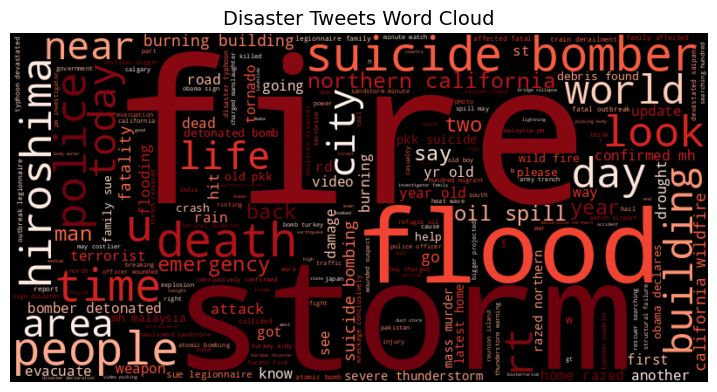

In [93]:
# Plot the word clouds
plt.figure(figsize=(9, 5))
plt.imshow(disaster_wordcloud, interpolation='bilinear')
plt.title("Disaster Tweets Word Cloud", fontsize=14)
plt.axis('off')
plt.show()


This word cloud visualizes the most common words present in disaster-related tweets within the dataset. Word clouds are an effective way to represent textual data, where the size of the words corresponds to their frequency or prominence in the dataset.
Larger words such as "storm", "fire", "flood", "building", "suicide", "bomber", and "death" indicate their high frequency and importance in the dataset.

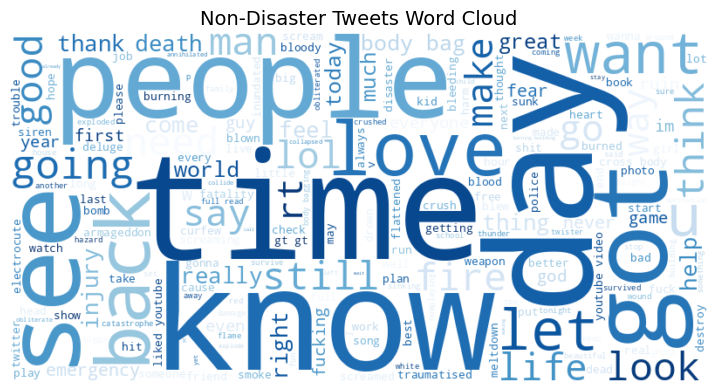

In [94]:
plt.figure(figsize=(9, 5))
plt.imshow(non_disaster_wordcloud, interpolation='bilinear')
plt.title("Non-Disaster Tweets Word Cloud", fontsize=14)
plt.axis('off')
plt.show()


# Tweet Length Distribution

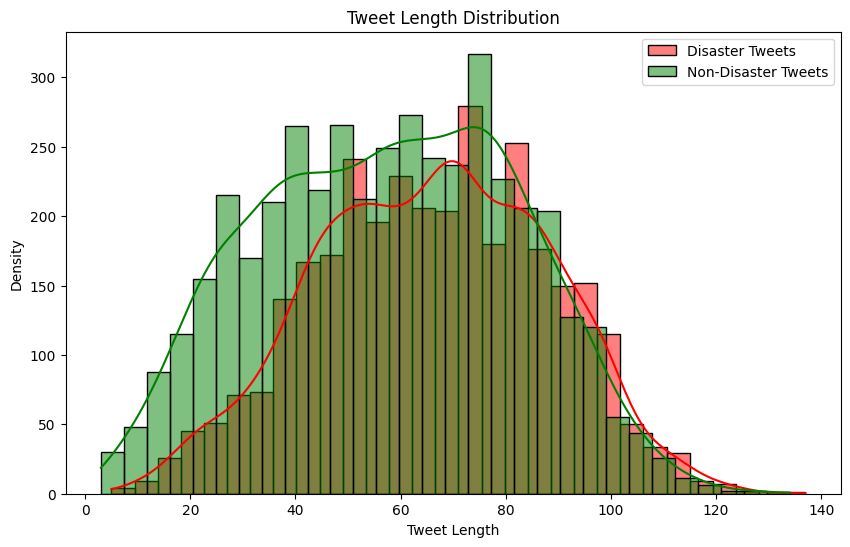

In [95]:
# Calculate tweet length based on cleaned text
train_df['tweet_length'] = train_df['cleaned_text'].apply(len)

# Plot tweet length distribution
plt.figure(figsize=(10, 6))
sns.histplot(train_df[train_df['target'] == 1]['tweet_length'], color='red', label='Disaster Tweets', kde=True, bins=30)
sns.histplot(train_df[train_df['target'] == 0]['tweet_length'], color='green', label='Non-Disaster Tweets', kde=True, bins=30)

# Labels and title
plt.xlabel('Tweet Length')
plt.ylabel('Density')
plt.title('Tweet Length Distribution')
plt.legend()
plt.show()

This figure compares the distributions of tweet lengths for disaster (in red) and non-disaster (green) tweets. Both distributions are somewhat normal-like in shape, with most tweets ranging from 40 to 100 characters. Disaster tweets are generally shorter, maxing out at around 40 to 60 characters, while the non-disaster tweets have a peak slightly above that at about 60 to 100 characters.

Additionally, non-disaster tweets reach a much denser peak for the very short and the very long tweets. This observation brings forth a thought that tweet length differentiation could be an important cue in telling the classes apart.

48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


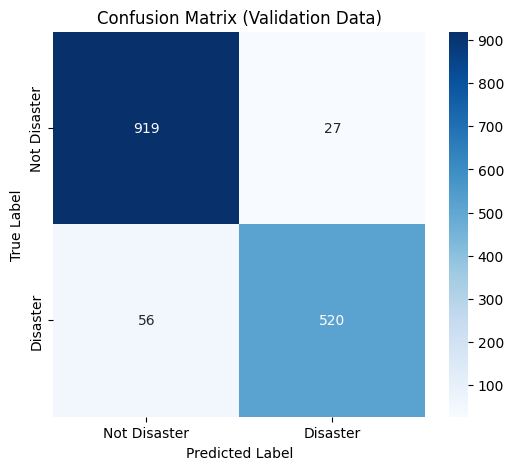

In [96]:
# Get validation labels (from training split)
y_val = y_train[:len(y_train) // 5]  # Assuming 20% validation split
y_val_pred = (best_model.predict(X_train[:len(y_val)]) > 0.47).astype(int).flatten()

# Generate confusion matrix
cm = confusion_matrix(y_val, y_val_pred)

# Plot the confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Disaster', 'Disaster'], yticklabels=['Not Disaster', 'Disaster'])
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title("Confusion Matrix (Validation Data)")
plt.show()


# F1 Score for Kaggle Competition

In [97]:
score = f1_score(y_val, y_val_pred)
print(f"F1 Score: {score}")

F1 Score: 0.9260908281389136


# Save Predictions to a CSV file

In [98]:
y_pred = (best_model.predict(X_test) > 0.4).astype(int)
predictions = pd.DataFrame({'id': test_df['id'], 'text': test_df['text'], 'prediction': y_pred.flatten()})
predictions_kaggle_comp = pd.DataFrame({'id': test_df['id'], 'prediction': y_pred.flatten()})
predictions.to_csv('predictions_tweet_test.csv', index=False)
predictions_kaggle_comp.to_csv('predictions_kaggle_comp.csv', index=False)
files.download('predictions_kaggle_comp.csv')

102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Plot training and validation Accuracy and Loss

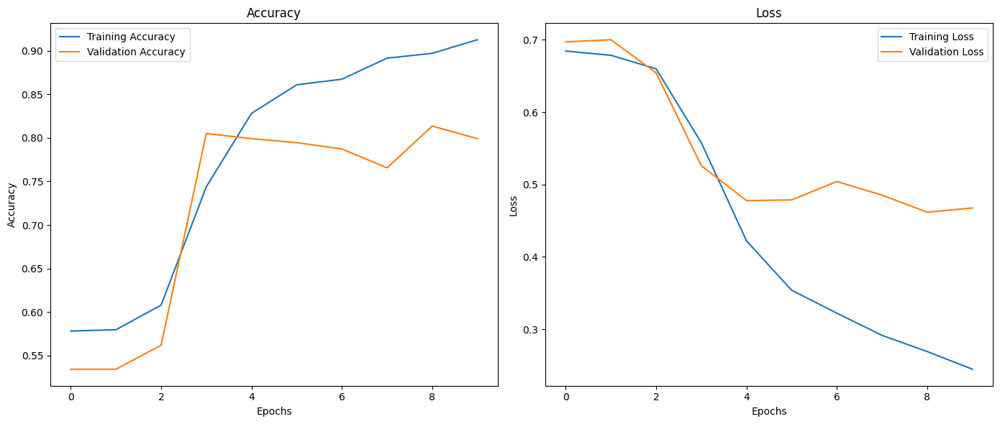

In [99]:
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


# Display predictions in a table format

In [100]:
table = PrettyTable(['ID', 'Text', 'Prediction'])
for _, row in predictions.iterrows():
    table.add_row([row['id'], row['text'], row['prediction']])
print(table)

+-------+---------------------------------------------------------------------------------------------------------------------------------------------------------+------------+
|   ID  |                                                                           Text                                                                          | Prediction |
+-------+---------------------------------------------------------------------------------------------------------------------------------------------------------+------------+
|   0   |                                                            Just happened a terrible car crash                                                           |     1      |
|   2   |                                             Heard about #earthquake is different cities, stay safe everyone.                                            |     1      |
|   3   |                             there is a forest fire at spot pond, geese are fleeing across the street, I c

# Launch TensorBoard

In [101]:
%load_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Saving the tokenizer

In [102]:
import pickle
with open("basic_tokenizer.pkl", "wb") as f:
    pickle.dump(tokenizer, f)

# Saving the Model

In [103]:
import tensorflow as tf
best_model.save("basic_model.keras")
print("Basic Model saved as 'basic_model.keras'!")

Basic Model saved as 'basic_model.keras'!
